# Phase 3 Final Project Submission
- Student name: Kevin Spring
- Student pace: Flex
- Scheduled project review date/time: (Deadline) October 17 2022
- Instructor name: Morgan Jones
- Blog post URL:

## Summary
- 

 # Introduction

Moderna, Inc. is a biotechnology company based in Cambridge, Massachusetts focused on RNA therapeutics such as mRNA vaccines. The use of RNA therapeutics reduces the demands of design and speeds up production of the therapies as compared to traditional vaccines. Moderna’s only current commercial product is Spikevax, a vaccine for SARS-CoV-2, the causative agent of COVID-19. With the success of this Spikevax, Moderna has been developing other RNA-based vaccines for diseases such as influenza, HIV, and various cancer in its production pipeline. It currently has 44 vaccines and treatments in their production pipeline, of which 22 are in clinical trials. One of these vaccines in Phase 3 trials is a single-shot SARS-CoV-2 and influenza vaccine, called mRNA-1073, to prevent severe reactions and hospitalization to the seasonal influenza virus and SARS-CoV-2.

## Influenza
Influenza (the flu) is an infectious disease caused by influenza viruses. Symptoms may include a runny nose, sore throat, muscle pain, headache, coughing, and fatigue. Symptoms begin one to four days after exposure and may last for two to eight days. Influenza can lead to complications such as pneumonia, acute respiratory distress syndrome, meningitis, and encephalitis. The virus is spread through droplet transmission when they are produced by coughing and sneezing and directly inhaled or picked up through intermediate objects.

In high-risk groups like those with asthma or cardiovascular illness, an influenza virus infection can be fatal. The Centers for Disease Control and Prevention (CDC), estimates that 35 million people in the United States had symptoms of influenza in 2020 that lead to 17 million medical office visits and 380,000 hospitalizations (cite CDC About the Flu). It is the cause of death for 18,000 to 80,000 people in the United States in 2019-2020.

![Flu Burden from 2010 to 2019](images/Flu_Burden.png)

## COVID-19
COVID-19 is an infectious respiratory disease caused by SARS-CoV-2 virus. Symptomsm include fever, headache, sore throat, loss of smell, fatigue, and breathing difficulties. A severe illness may lead to pneumonia, hypoxia, or respiratory failure. The virus is transmitted through the respiratory system when contaminated droplets and airborne particles that contain the virus are inhaled.

The first reported case of COVID-19 was in December of 2019 at Wuhan, China. Since then SARS-CoV-2 has become a pandemic with over one million deaths in the United States.

## mRNA Vaccines

Conventional vaccines make use of inactivating or attenuating the pathogen but some infectious pathogens have evolved clever ways to evade the human adaptive immune response. Conventional vaccines also take a long time to develop

Moderna’s mRNA vaccine technology shows 90+% effectiveness against symptoms while the traditional seasonal influenza vaccine is 40-60% effective. If mRNA-1073 is granted FDA approval, this combined vaccine is expected to supplant the current seasonal influenza vaccine. 

## Business Problem

While a vaccine may be very effective, it is only going to help if a patient is given the vaccine. In this regard, Modern needs knowledge of how people's backgrounds, opinions, and health behaviors are related to their personal vaccination patterns. With this understanding, Moderna can design targeted promotions on their vaccines and get susceptible populations vaccinated.

Specfically, Moderna needs:
* What variables are most relevant to predicting if someone chooses or does not choose to be vaccinated?
* A tool to predict if a person will receive the vaccine.

# Data

## Data Source
Between 2009 and 2010, the [National 2009 H1N1 Flu Survey (NHFS)](https://www.cdc.gov/nchs/nis/data_files_h1n1.htm) was conducted by the CDC. This phone survey asked respondents whether they had received the H1N1 influenza and seasonal influenza vaccines and additional questions covering their social, economic, and demographic background, opinions on risks of illness and vaccine effectiveness, and behaviors towards mitigating transmission. This was in reaction to a novel influenza virus, H1N1 or ‘swine flu’, beggining to circulate in the United States. A vaccine for H1N1 was developed and available to the public by the end of 2009. This vaccine was separate from the traditional influenza vaccine because H1N1 emerged too late to be included in the trivalent seasonal influenza vaccine for 2009.

A partially cleaned version of the 2009 NHFS survey was obtained from [Driven Data](https://www.drivendata.org/competitions/66/flu-shot-learning/page/211/#metric)

## Suitability of Data
While this data is over 10 years old and targets only part of the potential vaccine cocktail Moderna, Inc. will include, this dataset can be used to build a predictive model in line with Moderna’s needs. Moderna Inc. wants to have a predictive model to identify individuals that will be vaccinated against influenza and COVID-19 in a combined vaccine. The last time there was a serious novel respiratory virus pandemic like COVID-19 was in 2009 during the H1N1 pandemic. This time period accurately reflects our current period of having a regular seasonal flu vaccine and a separate novel respiratory virus circulating. After 2009, H1N1 was included in the seasonal influenza vaccine and the population only had to have a single influenza vaccination. 

In [807]:
# Import the data

import pandas as pd

data_features = pd.read_csv('data/training_set_features.csv') # predictors
data_target = pd.read_csv('data/training_set_labels.csv') # target
data = pd.concat([data_features, data_target], axis=1)

## Data Exploration

In [808]:
# Shape of data features
print(f'Size of dataset')
print(f'Number of Observations: {data.shape[0]}')
print(f'Number of variables: {data.shape[1]}')
data.info()

Size of dataset
Number of Observations: 26707
Number of variables: 39
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26707 entries, 0 to 26706
Data columns (total 39 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   respondent_id                26707 non-null  int64  
 1   h1n1_concern                 26615 non-null  float64
 2   h1n1_knowledge               26591 non-null  float64
 3   behavioral_antiviral_meds    26636 non-null  float64
 4   behavioral_avoidance         26499 non-null  float64
 5   behavioral_face_mask         26688 non-null  float64
 6   behavioral_wash_hands        26665 non-null  float64
 7   behavioral_large_gatherings  26620 non-null  float64
 8   behavioral_outside_home      26625 non-null  float64
 9   behavioral_touch_face        26579 non-null  float64
 10  doctor_recc_h1n1             24547 non-null  float64
 11  doctor_recc_seasonal         24547 non-null  float64
 12  chro

### Variable Information
| Variable                      | Data Type | Description                                                                               | Values                                                                                                      |
|-------------------------------|-----------|--------------------------------------------------------------------------------------|------------------------------------------------------------------------------------------------------------------|
| `h1n1_concern`                | Discrete  | Level of concern about H1N1 flu                                                      | 0 = Not at all concerned, 1 = Not very concerned, 2 = Somewhat concerned, 3 = Very concerned,                    |
| `h1n1_knowledge`              | Discrete  | Level of knowledge about H1N1 flu                                                    | 0 = No knowledge, 1 = A little knowledge, 2 = A lot of knowledge,                                                |
| `behavioral_antiviral_meds`   | Binary    | Has taken antiviral medication                                                       | 0 = No, 1 = Yes                                                                                                  |
| `behavioral_avoidance         | Binary    | Has avoided close contact with others with flu-like symptoms                         | 0 = No, 1 = Yes                                                                                                  |
| `behavioral_face_mask`        | Binary    | Has bought a face mask                                                               | 0 = No, 1 = Yes                                                                                                  |
| `behavioral_large_gatherings' | Binary    | Has reduced time at large gatherings                                                 | 0 = No, 1 = Yes                                                                                                  |
| `behavioral_outside_home`     | Binary    | Has reduced contact with people outside of own household                             | 0 = No, 1 = Yes                                                                                                  |
| `behavioral_touch_face`       | Binary    | Has avoided touching eyes, nose, or mouth                                            | 0 = No, 1 = Yes                                                                                                  |
| `doctor_recc_h1n1`            | Binary    | H1N1 flu vaccine was recommended by doctor                                           | 0 = No, 1 = Yes                                                                                                  |
| `doctor_recc_seasonal`        | Binary    | Seasonal flu vaccine was recommended by doctor                                       | 0 = No, 1 = Yes                                                                                                  |
| `chronic_med_condition`       | Binary    | Has chronic medical condition                                                        | 0 = No, 1 = Yes                                                                                                  |
| `children_under_6_months`     | Binary    | Has regular close contact with a child under the age of six months                   | 0 = No, 1 = Yes                                                                                                  |
| `health_worker`               | Binary    | Is a healthcare worker                                                               | 0 = No, 1 = Yes                                                                                                  |
| `health_insurance`            | Binary    | Has health insurance                                                                 | 0 = No, 1 = Yes                                                                                                  |
| `opinion_h1n1_vacc_effective` | Discrete  | Respondent's opinion about H1N1 vaccine effectiveness                                | 1 = Not at all effective,  2 = Not very effective,  3 = Don't know,  4 = Somewhat effective,  5 = Very effective |
| `opinion_h1n1_sick_from_vacc` | Discrete  | Respondent's worry of getting sick from taking H1N1 vaccine                          | 1 = Not at all worried,  2 = Not very worried,  3 = Don't know,  4 = Somewhat worried,  5 = Very worried         |
| `opinion_seas_risk`           | Discrete  | Respondent's opinion about risk of getting sick with seasonal flu without vaccine    | 1 = Very low,  2 = Somewhat low,  3 = Don't know,  4 = Somewhat high,  5 = Very high                             |
| `opinion_seas_sick_from_vacc` | Discrete  | Respondent's worry of getting sick from taking seasonal flu vaccine                  | 1 = Not at all worried,  2 = Not very worried,  3 = Don't know,  4 = Somewhat worried,  5 = Very worried         |
| `age_group`                   | Ordinal   | Age group of respondent                                                              | 65+ Years,  55 - 64 Years,  45 - 54 Years,  35 - 44 Years,  18 - 34 Years                                        |
| `education`                   | Ordinal   | Self-reported education level                                                        | College graduate,  Some college,  12 years,  < 12 Years                                                          |
| `sex`                         | Nominal   | Sex of respondent                                                                    | Male or Female                                                                                                   |
| `race`                        | Nominal   | Race of respondent                                                                   | White,  Black,  Hispanic,  Other or Multiple                                                                     |
| `income_poverty`              | Ordinal   | Household annual income of respondent with respect to 2008 Census poverty thresholds | > \\$75,000,  <= \\$75,000 Above poverty,  Below poverty                                                             |
| `marital_status`              | Nominal   | Marital status of respondent                                                         | Married or Not Married                                                                                           |
| `rent_or_own`                 | Nominal   | Housing situation of respondent                                                      | Rent or Own                                                                                                      |
| `employment_status`           | Nominal   | Employment status of respondent                                                      | Employed,  Unemployed,  Not in labor force                                                                       |
| `hhs_geo_region`              | Nominal   | Respondent's residence using a 10-region geographic coded classification             | Coded random strings                                                                                             |
| `census_msa`                  | Nominal   | Respondent's residence within metropolitan statistical areas                         | MSA not principle city,  MSA principle city,  Non-MSA                                                            |
| `household_adults`            | Discrete  | Number of *other* adults in household, top-coded to 3                                | 0, 1, 2, 3                                                                                                       |
| `household_children`          | Discrete  | Number of children in household, top-coded to 3                                      | 0, 1, 2, 3                                                                                                       |
| `employment_industry`         | Nominal   | Type of industry respondent is employed                                              | Coded random strings                                                                                             |
| `employment_occupation`       | Nominal   | Type of occupation of respondent                                                     | Coded random strings  
| `seasonal_vaccine`            | Binary    | Respondent's report of getting the seasonal influenza vaccination                  | 0, 1
| `h1n1_vaccine`                | Binary    | Respondent's report of getting the H1N1 influenza vaccination                     | 0, 1
|

In [831]:
data.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
respondent_id,26707.0,NaN,NaN,NaN,13353.0,7709.791156,0.0,6676.5,13353.0,20029.5,26706.0
h1n1_concern,26615.0,NaN,NaN,NaN,1.618486,0.910311,0.0,1.0,2.0,2.0,3.0
h1n1_knowledge,26591.0,NaN,NaN,NaN,1.262532,0.618149,0.0,1.0,1.0,2.0,2.0
behavioral_antiviral_meds,26636.0,NaN,NaN,NaN,0.048844,0.215545,0.0,0.0,0.0,0.0,1.0
behavioral_avoidance,26499.0,NaN,NaN,NaN,0.725612,0.446214,0.0,0.0,1.0,1.0,1.0
behavioral_face_mask,26688.0,NaN,NaN,NaN,0.068982,0.253429,0.0,0.0,0.0,0.0,1.0
behavioral_wash_hands,26665.0,NaN,NaN,NaN,0.825614,0.379448,0.0,1.0,1.0,1.0,1.0
behavioral_large_gatherings,26620.0,NaN,NaN,NaN,0.35864,0.47961,0.0,0.0,0.0,1.0,1.0
behavioral_outside_home,26625.0,NaN,NaN,NaN,0.337315,0.472802,0.0,0.0,0.0,1.0,1.0
behavioral_touch_face,26579.0,NaN,NaN,NaN,0.677264,0.467531,0.0,0.0,1.0,1.0,1.0


## Data Scrubbing

Strategy
1. Identify balance of target variables
2. Identify duplicated data
3. Identify missing data with NA or placeholders
4. Variable selection
5. Encode variables 

In [338]:
import matplotlib.pyplot as plt
%matplotlib inline

### 1. Identify balanced or unbalanced target variable

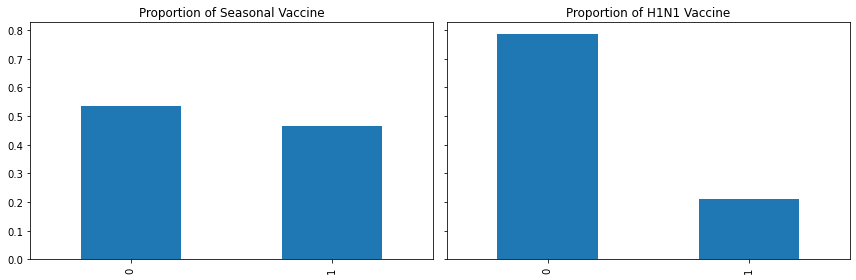

In [830]:
fig, axes = plt.subplots(1, 2, sharey=True, figsize=(12,4))

(data['seasonal_vaccine']
    .value_counts(normalize=True)
    .plot.bar(title="Proportion of Seasonal Vaccine", ax=axes[0])
)

(data['h1n1_vaccine']
    .value_counts(normalize=True)
    .plot.bar(title="Proportion of H1N1 Vaccine", ax=axes[1])
)

fig.tight_layout()


#### Imbalance Discussion
In regards to the `seasonal_vaccine` target, this variable is balanced with the possible responses, 'No' (0) and 'Yes' (1) both being about 50% in the data.

The `h1n1_vaccine` variable is not blanced. My prediction only needs to target one possible vaccination thus I will not be using this variable as a target.

### 2. Identify duplicated data

In [339]:
# Duplicates
duplicates_len = data.duplicated().sum()

print(f"Results:\nThere are {duplicates_len} duplicated records.")

Results:
There are 0 duplicated records.


#### Duplicated Data Discussion
According to my results there is no duplicated data in this dataset.

## 2. Identify missing data

In [340]:
# null values
print(f'''
There is {data.shape[0]} records and 
{data.shape[1]} variable in the dataset.
''')

print(f'Number of Missing values\n-------------------------\n{data.isna().sum().sort_values(ascending=False)}')


There is 26707 records and 
36 variable in the dataset.

Number of Missing values
-------------------------
employment_occupation          13470
employment_industry            13330
health_insurance               12274
income_poverty                  4423
doctor_recc_h1n1                2160
doctor_recc_seasonal            2160
rent_or_own                     2042
employment_status               1463
marital_status                  1408
education                       1407
chronic_med_condition            971
child_under_6_months             820
health_worker                    804
opinion_seas_sick_from_vacc      537
opinion_seas_risk                514
opinion_seas_vacc_effective      462
opinion_h1n1_sick_from_vacc      395
opinion_h1n1_vacc_effective      391
opinion_h1n1_risk                388
household_adults                 249
household_children               249
behavioral_avoidance             208
behavioral_touch_face            128
h1n1_knowledge                   116
h1n

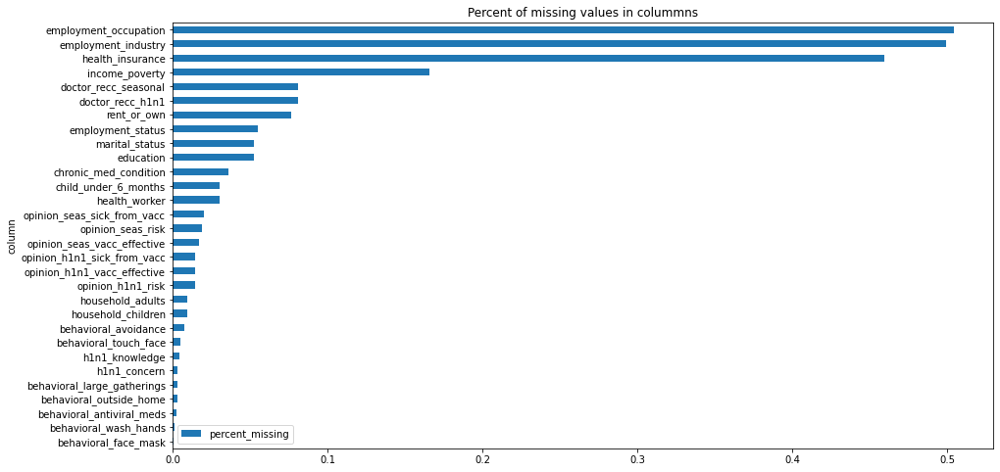

In [341]:
import pylab
import matplotlib.pyplot as plt

def plot_missing_values(df):
    # Attribute: https://marloz.github.io/projects/sklearn/pipeline/missing/preprocessing/2020/03/20/sklearn-pipelines-missing-values.html
    """ For each column with missing values plot proportion that is missing."""
    data = [(col, df[col].isnull().sum() / len(df)) 
            for col in df.columns if df[col].isnull().sum() > 0]
    col_names = ['column', 'percent_missing']
    missing_df = pd.DataFrame(data, columns=col_names).sort_values('percent_missing')
    pylab.rcParams['figure.figsize'] = (15, 8)
    missing_df.plot(kind='barh', x='column', y='percent_missing'); 
    plt.title('Percent of missing values in colummns');
    
plot_missing_values(data)

### Placeholders for missing data

In [342]:
# Any placeholders?
# Look for top occuring values
print('2009 National Influenza Survey\n')
for col in data_features.columns:
    print(col, '\n', data_features[col].value_counts(normalize = True).head(10), '\n')

2009 National Influenza Survey

h1n1_concern 
 2.0    0.397332
1.0    0.306331
3.0    0.172497
0.0    0.123840
Name: h1n1_concern, dtype: float64 

h1n1_knowledge 
 1.0    0.548983
2.0    0.356775
0.0    0.094242
Name: h1n1_knowledge, dtype: float64 

behavioral_antiviral_meds 
 0.0    0.951156
1.0    0.048844
Name: behavioral_antiviral_meds, dtype: float64 

behavioral_avoidance 
 1.0    0.725612
0.0    0.274388
Name: behavioral_avoidance, dtype: float64 

behavioral_face_mask 
 0.0    0.931018
1.0    0.068982
Name: behavioral_face_mask, dtype: float64 

behavioral_wash_hands 
 1.0    0.825614
0.0    0.174386
Name: behavioral_wash_hands, dtype: float64 

behavioral_large_gatherings 
 0.0    0.64136
1.0    0.35864
Name: behavioral_large_gatherings, dtype: float64 

behavioral_outside_home 
 0.0    0.662685
1.0    0.337315
Name: behavioral_outside_home, dtype: float64 

behavioral_touch_face 
 1.0    0.677264
0.0    0.322736
Name: behavioral_touch_face, dtype: float64 

doctor_recc_h1n1

#### Missing Data and Values Discussion 
* No missing data in `age_group`, `race`, `sex`, `hhs_geo_region`, and `census_msa`
* In `race`, hispanic is an option while on the U.S. Census it is listed as an ethnicity.
* There is an equal number of `NA` in `household_adults` and `household_children`
* There is an equal number of `NA` in `doctor_recc_h1n1` and `doctor_recc_seasonal`
* large porportion of missing data for `health_insurance`, `employment_industry`, and `employment_occupation`
* census_msa: msa means metropolitan statistical area. 
    * MSA = urban
    * MSA, Not Prinicple city = suburban
    * Non-MSA = rural
* `hhs_geo_region` is in code and won't be meaningful
* `employment_history` is coded and won't be meaningful
* `employment_occupation` is coded and won't be meaningful

##### Correcting Missing Data
The [original documentation](https://www.cdc.gov/nchs/nis/data_files_h1n1.htm) for the survey indicates the respondent can refuse to answer a question so the missing data may be due to error, refusal, or mistakes. There is a large amount of missing data in `health_insurance`, `income_poverty`, `employment_industry`, and `employment_occupation` which may be due to refulsal out of privacy conerns by the respondent. The variables `age_group`, `race`, `sex`, `hhs_geo_region`, and `census_msa`have no missing data, while the reamining variables have a minor amount of missing data. I hypothesize that the variables with large porportion of missing data are due to refusal or ignorance. For this reason, I will keep missing data during encoding of the variables and create new variables (`*variable_is_na`) to indicate that this respondent has missing information for that variable.

### 4.  Variable Selection
As shown previously, the variable `h1n1_vaccine` is the respondent's answer to the question if they got the single H1N1 vaccination. This variable is very imbalanced and would not be a good predictor in a real world setting of whether would receive a vaccination. Moderna wants to be able to predict if a person would get a combined seasonal influenza and SARS-Cov-2 vaccination and it would be more logical to use the `seasonal_vaccine` as a target instead of `h1n1_vaccine`.

The data also shows that it is more common for people that received the H1N1 vaccine to also have received the seasonal flu vaccine. Only 3.6% of respondents claim they received only the H1N1 vaccine and not the seasonal influenza vaccine, but 17.5% of respondents claim they received both the seasonal and H1N1 vaccine. Almost 30% of respondents claim they only received the seasonal influenza vaccination and not the H1N1 vaccine.

Because of the high correlation with receiving the H1N1 vaccine and receiving the seasonal vaccine, the high imbalance in the variable, and no real-world need for this question in the future, this variable will be removed from the analysis.

The variables `hhs_geo_region`, `employment_industry`, and `employment_occupation` are all coded so to keep the respondent's privacy. Since will not offer any beneficial information, they will be removed from the dataset.

In [833]:
pd.crosstab(index=data_target['seasonal_vaccine'], columns=data_target['h1n1_vaccine'], normalize=True)
# pd.DataFrame(data_target[['h1n1_vaccine', 'seasonal_vaccine']].value_counts(normalize=True, sort=False))

h1n1_vaccine,0,1
seasonal_vaccine,,
0,0.497810,0.036582
1,0.289737,0.175871


#### Other H1N1 information
Variables associated with H1N1, such as `H1N1_concern` will be used as a stand-in and substitute for a new respiratory virus (COVID-19). While this is not exactly data on SARS-CoV-2, both are highly contagious, new respiratory viruses.

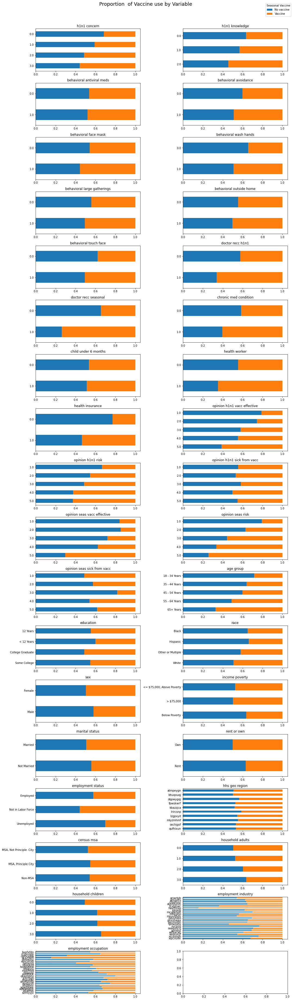

In [834]:
# Feature/Variable data exporation
features = data.columns[1:-3] # select all variables in the data except the targets and respondent_id
target='seasonal_vaccine'
# https://drivendata.co/blog/predict-flu-vaccine-data-benchmark/
# set number of columns
ncols = 2

# calculate number of rows
nrows = len(features) // ncols + (len(features) % ncols > 0)

fig, axes = plt.subplots(nrows, ncols, figsize=(15, 50))
#fig.subplots_adjust(hspace=1.0, wspace=0.2)

# unpack the axes subplots
axe = axes.ravel()

# Assign the plot to each subplot in the axe
for idx, feature in enumerate(features):
    
    # Calculate the counts
    counts = (data[[target, feature]]
                  .groupby([target, feature])
                  .size()
                  .unstack(target))
    group_counts = counts.sum(axis='columns')
    props = counts.div(group_counts, axis='index')
    props.plot(kind="barh", stacked=True, ax=axe[idx])
    
    # Chart formatting
    axe[idx].set_title(feature.replace('_', ' '))
    axe[idx].invert_yaxis()
    axe[idx].legend().remove()
    axe[idx].set_ylabel("")
    axe[idx].set_xlabel("")

fig.tight_layout()
fig.suptitle('Proportion  of Vaccine use by Variable', fontsize=18, y=1.02)
fig.legend(['No vaccine', 'Vaccine'], loc='upper right', bbox_to_anchor=(1, 1.02), title='Seasonal Vaccine')

#### Variable Selection Discussion
The following variables will be removed from the dataset and not used to build the prediction model:


| Variable         | Reason Removed |
| :---------------- | :-------------- |
| `respondent_id`  | Each observation has a specific code |
| `h1n1_vaccine`   | Not realistic, highly correlated with `seasonal_vaccine`, and only need to predict one vaccination status |
| `hhs_geo_region` | Coded and not interpretable |
| `employment_industry`  | Coded and not interpretable |
| `employment_occupation` | Coded and not interpretable |


In [835]:
# Remove unnecessary or redundant variables
#data_features.drop(['respondent_id'], axis=1, inplace=True)
data.drop(['respondent_id', 'h1n1_vaccine', 'hhs_geo_region', 'employment_industry', 'employment_occupation'], 
          axis=1, 
          inplace=True)


In [837]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26707 entries, 0 to 26706
Data columns (total 33 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   h1n1_concern                 26615 non-null  float64
 1   h1n1_knowledge               26591 non-null  float64
 2   behavioral_antiviral_meds    26636 non-null  float64
 3   behavioral_avoidance         26499 non-null  float64
 4   behavioral_face_mask         26688 non-null  float64
 5   behavioral_wash_hands        26665 non-null  float64
 6   behavioral_large_gatherings  26620 non-null  float64
 7   behavioral_outside_home      26625 non-null  float64
 8   behavioral_touch_face        26579 non-null  float64
 9   doctor_recc_h1n1             24547 non-null  float64
 10  doctor_recc_seasonal         24547 non-null  float64
 11  chronic_med_condition        25736 non-null  float64
 12  child_under_6_months         25887 non-null  float64
 13  health_worker   

### 5. Encode variables

All varaibles will be One-Hot-Encoded (OHE). Some variables are oridinal but that extra information is unnecessary for the models I will be using.

In [838]:
from sklearn.model_selection import train_test_split

y = data['seasonal_vaccine'] # target
X = data.drop('seasonal_vaccine', axis=1) # features

# Train-test split
SEED = 42 # seed to set random_state for all models
X_train, X_test, y_train, y_test = train_test_split(X, 
                                                    y, 
                                                    test_size=0.25, 
                                                    random_state=SEED)

In [471]:
# import OneHotEncoder
from sklearn.preprocessing import OneHotEncoder

# Initialize
ohe = OneHotEncoder()
# fit encoder on X data
ohe.fit(X_train)
X_train_ohe = ohe.transform(X_train).toarray()

# Dataframe to visualize
X_train_ohe_df = pd.DataFrame(X_train_ohe, columns=ohe.get_feature_names(X_train.columns))

## Model 1: Decision Tree (dt_clf_cv)

In [477]:
# Decision Tree
# Modeling
# Base model: Decision Tree
from sklearn import tree
from sklearn import metrics
from sklearn.model_selection import cross_validate

dt_clf = tree.DecisionTreeClassifier(criterion='entropy')
dt_clf_cv = cross_validate(dt_clf, 
                           X_train_ohe_df, 
                           y_train, 
                           scoring=('accuracy', 'f1', 'precision', 'recall', 'roc_auc'),
                           cv=5)

# Output Cross-validated metrics
for key in dt_clf_cv:
    print(f'Decision Tree {key}: {dt_clf_cv[key].mean():.2%}')

Decision Tree fit_time: 37.64%
Decision Tree score_time: 1.78%
Decision Tree test_accuracy: 68.81%
Decision Tree test_f1: 66.72%
Decision Tree test_precision: 66.76%
Decision Tree test_recall: 66.68%
Decision Tree test_roc_auc: 68.68%


## Model 2: Grid search tuned Decision Tree

In [484]:
# Model 2: Using GridSearch to tune DecisionTree

# Start by using RandomizedSearchCV to narrow down the range for each
## hyperparameter

from sklearn.model_selection import RandomizedSearchCV
max_depth = [int(x) for x in range(0, 55, 5)]
max_depth.append(None)
# Create the random grid
dt_param_grid = {'criterion': ['gini', 'entropy', 'log-loss'],
               'splitter': ['best', 'random'],
                # Number of features to consider at every split
               'max_features': ['auto', 'sqrt', 'log2'],
                # Maximum number of levels in tree
               'max_depth': max_depth,
                # Minimum number of samples required to split a node
               'min_samples_split': [int(x) for x in range(2, 22, 2)],
                # Minimum number of samples required at each leaf node
               'min_samples_leaf': [int(x) for x in range(5, 50, 5)]}

dt_param_grid

{'criterion': ['gini', 'entropy', 'log-loss'],
 'splitter': ['best', 'random'],
 'max_features': ['auto', 'sqrt', 'log2'],
 'max_depth': [0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, None],
 'min_samples_split': [2, 4, 6, 8, 10, 12, 14, 16, 18, 20],
 'min_samples_leaf': [5, 10, 15, 20, 25, 30, 35, 40, 45]}

In [486]:
# Random grid search to search for best hyperparameters
# Use the random grid to search for best hyperparameters

# First create the base model to tune
dt = tree.DecisionTreeClassifier()

# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
dt_random = RandomizedSearchCV(estimator = dt, 
                               param_distributions = dt_param_grid, 
                               n_iter = 500, 
                               cv = 5, 
                               verbose=2, 
                               random_state=SEED, 
                               n_jobs = -1)

# Fit the random search model
dt_random.fit(X_train_ohe_df, y_train)

Fitting 5 folds for each of 500 candidates, totalling 2500 fits


D:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:922: UserWarning: One or more of the test scores are non-finite: [0.70359461 0.7089366  0.70604094        nan        nan 0.70174738
 0.69970045        nan 0.72396405 0.69655517        nan 0.71977034
 0.7347978         nan 0.7119321         nan        nan 0.72536196
        nan 0.70678982        nan        nan 0.70324513 0.71422866
 0.72161757        nan 0.71547678 0.71183225        nan 0.73130305
 0.72321518 0.73484773        nan 0.70239641 0.69151273        nan
 0.70693959 0.7117324         nan 0.69450824 0.73115327 0.72451323
 0.70818772 0.72675986        nan 0.72261608 0.70963555        nan
 0.71377933 0.72670994        nan 0.72985522 0.71962057 0.70579131
 0.7123315  0.72561158 0.70554169 0.72810784        nan        nan
        nan        nan 0.7        0.72825761        nan 0.71038442
        nan 0.72231653 0.72151772 0.72311533        nan 0.72770844
 0.70644034 0.71402896 0.7232651  0.72965552 0.729555

RandomizedSearchCV(cv=5, estimator=DecisionTreeClassifier(), n_iter=500,
                   n_jobs=-1,
                   param_distributions={'criterion': ['gini', 'entropy',
                                                      'log-loss'],
                                        'max_depth': [0, 5, 10, 15, 20, 25, 30,
                                                      35, 40, 45, 50, None],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [5, 10, 15, 20, 25,
                                                             30, 35, 40, 45],
                                        'min_samples_split': [2, 4, 6, 8, 10,
                                                              12, 14, 16, 18,
                                                              20],
                                        'splitter': ['best', 'random']},
       

In [487]:
dt_random.best_params_

{'splitter': 'best',
 'min_samples_split': 16,
 'min_samples_leaf': 40,
 'max_features': 'sqrt',
 'max_depth': 45,
 'criterion': 'gini'}

In [557]:
# Grid Search
from sklearn.model_selection import GridSearchCV

# Make a new parameter grid based on the best parameters from the RandomSearchCV
dt_param_grid = {
    'splitter':[dt_random.best_params_['splitter']],
    'criterion':[dt_random.best_params_['criterion']],
    'max_features':[dt_random.best_params_['max_features']],
    'max_depth':[int(x) for x in range((dt_random.best_params_['max_depth']-5),
                                       (dt_random.best_params_['max_depth']+5),
                                       1)],
    'min_samples_split':[int(x) for x in range((dt_random.best_params_['min_samples_split']-5),
                                               (dt_random.best_params_['min_samples_split']+5),
                                               1)],
    'min_samples_leaf':[int(x) for x in range(dt_random.best_params_['min_samples_leaf']-5,
                                              dt_random.best_params_['min_samples_leaf']+5,
                                              1)]
}

dt_grid = GridSearchCV(clf_dt, 
                              param_grid=dt_param_grid,
                              cv=3,
                              return_train_score=True,
                              n_jobs = -1,
                              verbose=1)

dt_grid.fit(X_train_ohe_df, y_train)

Fitting 3 folds for each of 1000 candidates, totalling 3000 fits


GridSearchCV(cv=3, estimator=DecisionTreeClassifier(criterion='entropy'),
             n_jobs=-1,
             param_grid={'criterion': ['gini'],
                         'max_depth': [40, 41, 42, 43, 44, 45, 46, 47, 48, 49],
                         'max_features': ['sqrt'],
                         'min_samples_leaf': [35, 36, 37, 38, 39, 40, 41, 42,
                                              43, 44],
                         'min_samples_split': [11, 12, 13, 14, 15, 16, 17, 18,
                                               19, 20],
                         'splitter': ['best']},
             return_train_score=True, verbose=1)

In [558]:
# Best parameters
dt_grid.best_params_

{'criterion': 'gini',
 'max_depth': 46,
 'max_features': 'sqrt',
 'min_samples_leaf': 39,
 'min_samples_split': 18,
 'splitter': 'best'}

In [559]:
# Extracting the importances by sklearn 
importances_sk = dt_grid.best_estimator_.fit(X_train_ohe, y_train).feature_importances_

# Creating a dataframe with the feature importance by sklearn
feature_importance_sk = {}
for i, feature in enumerate(X_train_ohe_df.columns):
    feature_importance_sk[feature] = round(importances_sk[i], 3)

display(pd.DataFrame(feature_importance_sk.items(), 
                     columns=['Feature', 
                              'Importance']).sort_values('Importance', ascending=False).head(15))


,Feature,Importance
34,doctor_recc_seasonal_1.0,0.274
70,opinion_seas_vacc_effective_5.0,0.149
76,opinion_seas_risk_5.0,0.124
72,opinion_seas_risk_1.0,0.055
30,doctor_recc_h1n1_0.0,0.037
52,opinion_h1n1_vacc_effective_5.0,0.032
84,age_group_18 - 34 Years,0.031
54,opinion_h1n1_risk_1.0,0.030
88,age_group_65+ Years,0.022
73,opinion_seas_risk_2.0,0.021


In [493]:
# Decision Tree Plot
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(55,25), dpi=600)
tree.plot_tree(dt_grid.best_estimator_.fit(X_train_ohe_df, y_train), # choose best params
               feature_names = X_train_ohe_df.columns,
               class_names=np.unique(y_train).astype('str'),
               filled = True, 
               rounded=True, 
               fontsize=5,
               impurity='False',
               label='root')

plt.savefig('images/decision_tree_plot.png')
plt.show()
plt.close()

## Model 3 Random Forest
Random forest is a supervised learning algorithm that uses an ensemble of decision trees. A decision tree will maximize the information gain at every branch.

In [494]:
# Instantiate and fit a Random Forest Classifier
from sklearn.ensemble import RandomForestClassifier

# Start with hyperparemeters from Decision Tree Grid Search Best Parameters
forest = RandomForestClassifier(max_samples=1000,
                                criterion=dt_grid.best_params_['criterion'],
                                max_depth=dt_grid.best_params_['max_depth'],
                                max_features=dt_grid.best_params_['max_features'],
                                min_samples_leaf=dt_grid.best_params_['min_samples_leaf'],
                                min_samples_split=dt_grid.best_params_['min_samples_split'])

forest.fit(X_train_ohe_df, y_train)

RandomForestClassifier(max_depth=40, max_features='sqrt', max_samples=1000,
                       min_samples_leaf=38, min_samples_split=18)

## Model 4: Random Forest with Hyperparameter Tuning

In [503]:
# Random Forest Hyperparameter Tuning

from sklearn.model_selection import RandomizedSearchCV

# Create the random grid parameters
max_depth = [int(x) for x in range(0, 55, 5)]
max_depth.append(None)

random_grid_rf = {
    # Number of trees in the forest
    'n_estimators': [100, 500, 1000],
    # Number of features to consider when looking for the best split
    'max_features': ['auto', 'sqrt', 'log2', None],
    # Maximum number of levels in tree
    'max_depth': max_depth,
    # Minimum number of samples required to split a node
    'min_samples_split': [int(x) for x in range(2, 22, 2)],
    # Minimum number of samples required at each leaf node
    'min_samples_leaf': [int(x) for x in range(5, 50, 5)],
    # If bootstrapped samples are used to build trees
    'bootstrap': [True, False]}
print(random_grid_rf)

# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestClassifier(n_jobs=-1)

# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, 
                               param_distributions = random_grid_rf, 
                               n_iter = 50, 
                               cv = 3, 
                               random_state=SEED, 
                               n_jobs = -1,
                               verbose=1)
# Fit the random search model
rf_random.fit(X_train_ohe_df, y_train)


{'n_estimators': [100, 500, 1000], 'max_features': ['auto', 'sqrt', 'log2', None], 'max_depth': [0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, None], 'min_samples_split': [2, 4, 6, 8, 10, 12, 14, 16, 18, 20], 'min_samples_leaf': [5, 10, 15, 20, 25, 30, 35, 40, 45], 'bootstrap': [True, False]}
Fitting 3 folds for each of 50 candidates, totalling 150 fits


D:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:922: UserWarning: One or more of the test scores are non-finite: [0.75371963 0.7666002         nan 0.76934604 0.75731397 0.77368958
 0.77259126 0.77329017 0.77289082 0.77274095 0.77553686 0.77758368
 0.76405394 0.77678497 0.75267122 0.76779821 0.76055922        nan
 0.77269106 0.77274089 0.7705942  0.76949581 0.77044437 0.77953084
 0.77623574 0.77958083 0.76969559 0.77883182 0.71397848 0.77388923
 0.77528715 0.77873196 0.77074387 0.77109348        nan 0.77029465
 0.77448841 0.77309042 0.76025977 0.77848235 0.76285579 0.77378941
 0.77099372 0.77698463 0.77019479 0.77109353 0.76215682 0.77533716
 0.77169257 0.77373951]
  warnings.warn(


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(n_jobs=-1), n_iter=50,
                   n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [0, 5, 10, 15, 20, 25, 30,
                                                      35, 40, 45, 50, None],
                                        'max_features': ['auto', 'sqrt', 'log2',
                                                         None],
                                        'min_samples_leaf': [5, 10, 15, 20, 25,
                                                             30, 35, 40, 45],
                                        'min_samples_split': [2, 4, 6, 8, 10,
                                                              12, 14, 16, 18,
                                                              20],
                                        'n_estimators': [100, 500, 1000]},
                   random_state=42, verbose=1)

In [504]:
# Best parameters from fitting the random search
print(f'Best parameters: {rf_random.best_params_}')

#rf_random_score_training = rf_random.score(X_train, y_train)

Best parameters: {'n_estimators': 1000, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'max_depth': 30, 'bootstrap': False}


In [511]:
# Create parameter grid for GridSearchCV

# param_grid = {
#     'bootstrap': [rf_random.best_params_['bootstrap']],
#     'max_depth': [int(x) for x in range((rf_random.best_params_['max_depth']-4),
#                                         (rf_random.best_params_['max_depth']+4),
#                                         2)],
#     'max_features': [rf_random.best_params_['max_features']],
#     'min_samples_leaf': [int(x) for x in range((rf_random.best_params_['min_samples_leaf']-4),
#                                                (rf_random.best_params_['min_samples_leaf']+4),
#                                                2)],
#     'min_samples_split': [int(x) for x in range((rf_random.best_params_['min_samples_split']-4),
#                                                 (rf_random.best_params_['min_samples_split']+4),
#                                                 2)],
#     'n_estimators': [rf_random.best_params_['n_estimators']]
# }

# Base model
#rf = RandomForestClassifier()

# Initiate the grid search model
# rf_grid = GridSearchCV(estimator=rf,
#                        param_grid = param_grid,
#                        cv=3,
#                        n_jobs=-1,
#                        verbose=1)

# rf_grid.fit(X_train_ohe_df, y_train)

In [516]:
print(f'Best parameters from Grid Search Random Forest: {rf_random.best_params_}')

rf_random_score_training = rf_random.score(X_train_ohe_df, y_train)

print(f'''
The Random Forest with grid search hyperparameter tuning has a training accuracy of
{rf_random_score_training:.2%}. This is greater than the mean accuracy in the base decision tree, 
{gs_dt_training_score :.2%}, and the base random forest model, {forest_score_training:.2%}. 

The next model will be XGBoost.
''')

Best parameters from Grid Search Random Forest: {'n_estimators': 1000, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'max_depth': 30, 'bootstrap': False}

The Random Forest with grid search hyperparameter tuning has a training accuracy of
84.21%. This is greater than the mean accuracy in the base decision tree, 
73.48%, and the base random forest model, 75.53%. 

The next model will be XGBoost.



## Model 5: XGBoost with Random Search Cross-validation

In [521]:
# XGBoost Model
from xgboost import XGBClassifier

In [547]:
# XGBoost requires all classification categories be integers that count up from 0.


# Make parameter grid
param_grid = {
    'learning_rate': [0.01, 0.1, 1],
    'max_depth': [1, 10, 50, 100],
    'min_child_weight': [1, 2],
    'subsample': [0.5, 0.75],
    'n_estimators': [10, 100, 1000],
}

# Grid Search of XGBoost clsassifier
xgb_clf = XGBClassifier(use_label_encoder=False)
                        ## All my variables are one-hot encoded so they have 0 and 1 as their only values
                        ## so I do not need to transform the data.

xgb_random = RandomizedSearchCV(xgb_clf, 
                              param_grid, 
                              scoring='precision',
                              cv=3, 
                              n_jobs=-1)

# Must input .values because of the following error:
## feature_names must be string, and may not contain [, ] or < so use .values
xgb_random.fit(X_train_ohe_df.values, y_train.values)

RandomizedSearchCV(cv=3,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None,
                                           enable_categorical=False, gamma=None,
                                           gpu_id=None, importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate=None,
                                           max_delta_step=None, max_depth=None,
                                           min_child_weight=None, missing=nan,
                                           monotone_constraints...
                                           predictor=None, random_state=None,
                                           reg_alpha=None, reg_lambda=None,
                           

In [549]:
# Pickle these models so don't have to run models again
import joblib
import pickle
with open('pickled_models/decision_tree_model.pkl', 'wb') as f:
    joblib.dump(clf_dt, f)
    
with open('pickled_models/decision_tree_grid.pkl', 'wb') as f:
    joblib.dump(grid_search_dt, f)
    
with open('pickled_models/random_forest.pkl', 'wb') as f:
    joblib.dump(forest, f)
    
with open('pickled_models/random_forest_grid.pkl', 'wb') as f:
    joblib.dump(rf_random, f)

with open('pickled_models/xgboost.pkl', 'wb') as f:
    joblib.dump(xgb_random, f)

In [552]:
best_parameters = xgb_random.best_params_

print('Grid Search found the following optimal parameters: ')
for param_name in sorted(best_parameters.keys()):
    print('%s: %r' % (param_name, best_parameters[param_name]))

Grid Search found the following optimal parameters: 
learning_rate: 0.01
max_depth: 10
min_child_weight: 2
n_estimators: 100
subsample: 0.5


In [556]:


training_preds = xgb_random.predict(X_train_ohe_df)
xgb_training_score = xgb_random.score(X_train_ohe_df, y_train)
#training_accuracy = accuracy_score(y_train, training_preds)

print('')
print('Training Accuracy: {:.4}%'.format(xgb_training_score * 100))


Training Accuracy: 82.36%


# Model Evaluation

In [618]:
# Make a list of all the model classifier objects
classifiers = {'Grid Search Decision Tree': dt_grid, 
              'Random Forest': forest, 
              'Grid Search Random Forest': rf_random, 
              'Grid Search XGBoost': xgb_random}

#classifiers = [dt_grid, forest, rf_random, xgb_random]

![Example Confusion Matrix](images/confusion-matrix.png)

In [636]:
# Plot Confusion Matrix of Training Data
from sklearn.metrics import plot_confusion_matrix

# Dataframe to visualize
def confusion_matrix_models_plot(model_name_dict, features, target, training=True, save_plot = False):
    '''
    Plot confusion matrix for your models
    '''    
    fig, axes = plt.subplots(nrows=len(model_name_dict)//2, ncols=len(model_name_dict)//2, figsize=(15,10))
    
    # set fiture title
    if training:
        title = 'Training Data Confusion Matrix'
    else:
        title = 'Testing Data Confusion Matrix'
        
    fig.suptitle(title, fontsize=15)
    
    # Loop through  models and generate a confusion_matrix
    for cls, ax in zip(model_name_dict, axes.flatten()):
        plot_confusion_matrix(model_name_dict[cls], 
                              features, 
                              target, 
                              ax=ax, 
                              cmap='Blues',
                              display_labels=None)
        ax.title.set_text(cls)
    plt.tight_layout()  
    plt.show()
    



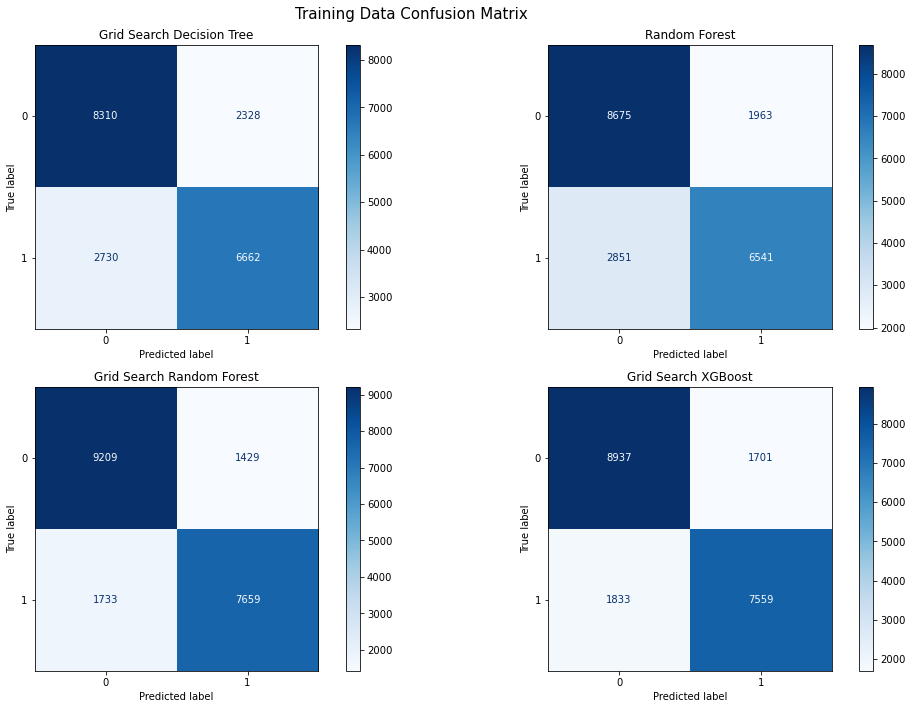

In [637]:
# Training Data Confusion Matrix for each classifier model
confusion_matrix_models_plot(classifiers, X_train_ohe_df, y_train, True, False)

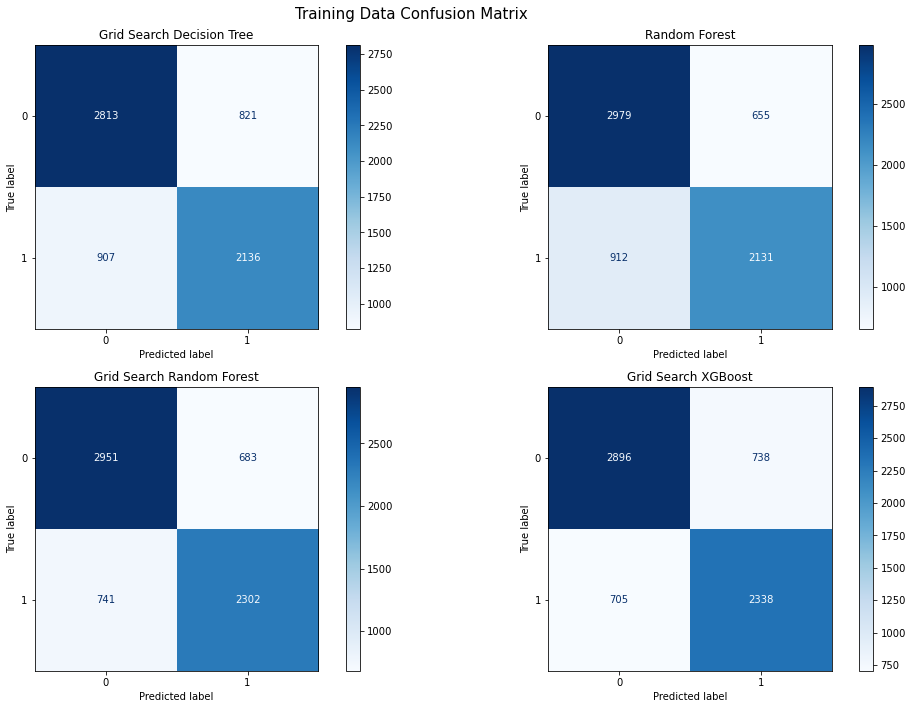

In [639]:
# Testing Data For each classifier model

# One-Hot encode testing features
X_test_ohe_df = pd.DataFrame(X_test_ohe, columns=ohe.get_feature_names(X_test.columns))

# Wrapper plot function
confusion_matrix_models_plot(classifiers, X_test_ohe_df, y_test, True, False)

In [651]:
def metric_measurements(model, features, target):
    from sklearn import metrics
    
    predict = model.predict(features) # make predictions from features
    tn, fp, fn, tp = confusion_matrix(target, predict).ravel()
    
    report = {} # initialize dictionary
    
    metric_report = metrics.classification_report(target, predict, output_dict=True)
    # Accuracy
    report['accuracy'] = metric_report['accuracy']
    # Precision
    report['precision'] = metric_report['1']['precision']
    # Recall or Sensitivity
    report['recall'] = metric_report['1']['recall']
    # F1 score
    report['f1_score'] = metric_report['1']['f1-score']
    # ROC AUC
    report['roc_auc'] = metrics.roc_auc_score(target, predict)
    # Specificity or recall of negative case
    report['specificity'] = metric_report['0']['recall'] # tn/(tn+fp)
    # Negative Predictive Value
    report['NPV'] = tn/(tn+fn)
    
    return report


In [652]:
def metric_df(model_dict, X, y):
    # got help from https://stackoverflow.com/questions/28669482/appending-pandas-dataframes-generated-in-a-for-loop
    results = []
    
    for key in model_dict:
        report = metric_measurements(model_list[key], X, y)
        df_temp = pd.DataFrame.from_records(report, index=[key])
        results.append(df_temp)
    
    results = pd.concat(results)
    
    return results       



------------Training Data Model Metrics------------


,NPV,accuracy,f1_score,precision,recall,roc_auc,specificity
Grid Search Decision Tree,0.752717,0.747479,0.724840,0.741046,0.709327,0.745244,0.781162
Random Forest,0.752646,0.759661,0.731001,0.769167,0.696444,0.755958,0.815473
Grid Search Random Forest,0.841619,0.842137,0.828896,0.842760,0.815481,0.840576,0.865670
Grid Search XGBoost,0.829805,0.823565,0.810530,0.816307,0.804834,0.822468,0.840102




------------Testing Data Model Metrics-------------



,NPV,accuracy,f1_score,precision,recall,roc_auc,specificity
Grid Search Decision Tree,0.756183,0.741201,0.712000,0.722354,0.701939,0.738009,0.774078
Random Forest,0.765613,0.765314,0.731172,0.764896,0.700296,0.760027,0.819758
Grid Search Random Forest,0.799296,0.786731,0.763769,0.771189,0.756490,0.784272,0.812053
Grid Search XGBoost,0.804221,0.783885,0.764177,0.760078,0.768321,0.782619,0.796918


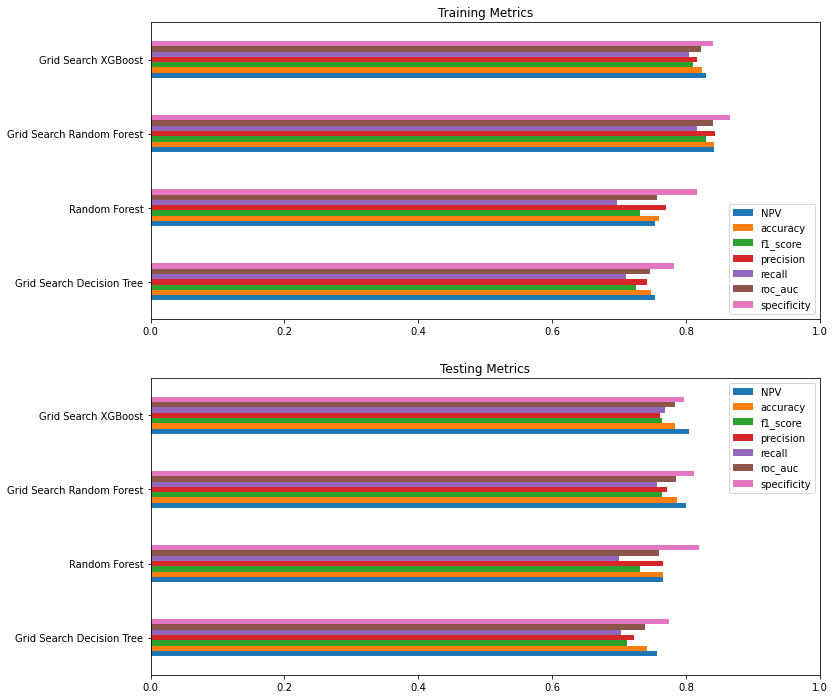

In [653]:
metrics_train_df = metric_df(model_list, X_train_ohe_df, y_train)
metrics_test_df = metric_df(model_list, X_test_ohe_df, y_test)

fig, axes = plt.subplots(2,1, figsize=(12,12))
metrics_train_df.plot(kind='barh', ax=axes[0])
metrics_test_df.plot(kind='barh', ax=axes[1])
axes[0].set_xlim(left=0, right=1)
axes[0].title.set_text('Training Metrics')
axes[1].set_xlim(left=0, right=1)
axes[1].title.set_text('Testing Metrics')
print('\n\n------------Training Data Model Metrics------------')
display(metrics_train_df)
print('\n\n------------Testing Data Model Metrics-------------\n')
display(metrics_test_df)

## Metric Performance

The business problem is that Moderna, Inc. wants to predict people that will not receive the vaccine and target these people with recommendations from their doctor, get them in touch with grants or insurance to cover their vaccination.

False Negative = Model predicts an instance as negative when it is actually positive.
False Positive = Model predicts an instance as positive when it is actually negative.

It may be more cost effective to strive to get those with confounding factors or get herd immunity than to convince very hesitant people to be vaccinated. In this case, it is more important to have fewer false positives than false negatives. Since we want people to be vaccinated we do not want a model that predicts a person will get the vaccine when in fact they do not want to. We want to be able to predict people that will not receive the vaccine so these people can be targeted to convince to get the vaccine.

### Accuracy
Accuracy is the ratio of the records that the model correctly classified over the total number of records. Accuracy is the measure of the total number of predicitons (positive and negative) a model gets right. It measures on average if the model finds the target.

### Precision (Positive predictive value)
Also known as the Positive Predictive Value (PPV), precision is the ratio of the positives that are correctly identified by the model over total positive records. Precision measures the proportion of positively predicted labels that are actually correct.

Precision answers the question, out of all the respondents the model said they had the vaccine, how many times did the respondent actually have the vaccine? 

If we want to minimize false negatives, we would choose a model with high precision. We do not need to minimize false negatives as much as false positives. This is because if our model predicts a person will not get the vaccine when in fact they have or will, the extra information given to them to convince them to get the vaccine may convince them even more to get the vaccine.

Precision is sensitive to false positive values. 

### Recall
Also known as sensitivity and the True Positive Rate (TPR), recall represents the model’s ability to correctly predict the positives out of actual positives. Our machine learning model is trying to identify positive vaccination outomes so the recall score would be what percent of those positive outcomes did the machine learning model correctly predict as a positive. It answers the question, out of all the respondents that actually got the vaccine, what percetage of them did our model correctly identify as having the vaccine? 

A high recall score indicates that the model is good at identifying positive examples. False negative predictions have an impact on the recall score.

If you want to minimize false negatives, then choose a model with higher recall. We want to minimize false positives so the recall score is not as important as precision.

### Specificity
Also called the True Negative Rate (TNR), specificity is a measure of how well a test can identify true negatives. It is calculated by $TN/(TN+FP)$. Moderna, Inc. wants to be able to predict people that will not get the vaccine so that they can be targeted 

### F1-score
The F1 score is a harmonic (weighted) average of precision and recall. 

### ROC-AUC